# Task 3: Graphs and Social Networks

Using the whole anthologies abstract dataset. 

1. From the abstracts part, using three different similarity thresholds (e.g. 0.05, 0.1, and 0.2), create an *unweighted network* from the obtained similar pairs (use MinHashing or LSH) for each threshold. 

2. From the basket list of authors/editors, using A-Priori or PCY, create a *weighted network*,  using the *support threshold* as weight.

3. Find the communities for the networks obtained in 1. and 2. Comment about the results with respect to the different thresholds and methods. How does it compare with the same analysis using 1-NN done in previous tasks?

4. Use a ready-made software, library or service (eg. gephi) for visualizing one the network in 1. or 2.Comment your results.

## 1. From the abstracts part, using three different similarity thresholds (e.g. 0.05, 0.1, and 0.2), create an *unweighted network* from the obtained similar pairs (use MinHashing or LSH) for each threshold. 

In [1]:
# import texts
import pandas as pd
from urllib.request import urlopen
from io import BytesIO
import gzip

url = 'https://aclanthology.org/anthology+abstracts.bib.gz'
with gzip.open(BytesIO(urlopen(url).read()), 'rb') as fb:
    with open('test.bib', 'wb') as f:
        f.write(fb.read())
        
file = open('test.bib')
for n in range(30):
    print(file.readline()[:-1])

@proceedings{woah-2021-online,
    title = "Proceedings of the 5th Workshop on Online Abuse and Harms (WOAH 2021)",
    editor = "Mostafazadeh Davani, Aida  and
      Kiela, Douwe  and
      Lambert, Mathias  and
      Vidgen, Bertie  and
      Prabhakaran, Vinodkumar  and
      Waseem, Zeerak",
    month = aug,
    year = "2021",
    address = "Online",
    publisher = "Association for Computational Linguistics",
    url = "https://aclanthology.org/2021.woah-1.0",
}
@inproceedings{singh-li-2021-exploiting,
    title = "Exploiting Auxiliary Data for Offensive Language Detection with Bidirectional Transformers",
    author = "Singh, Sumer  and
      Li, Sheng",
    booktitle = "Proceedings of the 5th Workshop on Online Abuse and Harms (WOAH 2021)",
    month = aug,
    year = "2021",
    address = "Online",
    publisher = "Association for Computational Linguistics",
    url = "https://aclanthology.org/2021.woah-1.1",
    doi = "10.18653/v1/2021.woah-1.1",
    pages = "1--5",
    abstra

In [2]:
# adding abstracts into a list

list_of_abstracts = []
key_word = '    abstract = "'
with open('anthology+abstracts.bib', encoding="utf8") as bibtex_file:
    for line in bibtex_file:
        if line.startswith(key_word):
            list_of_abstracts.append(line[len(key_word):-3])

In [3]:
# first 3 abstracts
list_of_abstracts[:3]

['Offensive language detection (OLD) has received increasing attention due to its societal impact. Recent work shows that bidirectional transformer based methods obtain impressive performance on OLD. However, such methods usually rely on large-scale well-labeled OLD datasets for model training. To address the issue of data/label scarcity in OLD, in this paper, we propose a simple yet effective domain adaptation approach to train bidirectional transformers. Our approach introduces domain adaptation (DA) training procedures to ALBERT, such that it can effectively exploit auxiliary data from source domains to improve the OLD performance in a target domain. Experimental results on benchmark datasets show that our approach, ALBERT (DA), obtains the state-of-the-art performance in most cases. Particularly, our approach significantly benefits underrepresented and under-performing classes, with a significant improvement over ALBERT.',
 'Hate speech and profanity detection suffer from data spar

In [4]:
# number of abstracts
print('Number of abstracts:', len(list_of_abstracts))

Number of abstracts: 30353


In [5]:
# clean up the abstracts
import re
minimum = 200
example = 0
count = {'empty':0, 
         f'short(<{minimum} char)': 0,
         'non latin': 0,
         'other': 0}

abstracts = []


for a in list_of_abstracts:
    if len(a) == 0:
        count['empty'] +=1
    elif len(re.findall('[a-zA-Z]', a)) < .2*len(a):
        count['non latin'] +=1
        if example < 2:
            print(a, '\n')
            example +=1
    elif len(a) < minimum:
        count[f'short(<{minimum} char)'] += 1
    else:
              count['other'] +=1
              abstracts.append(a)
            
for k,v in count.items():
              print(f'{k:>20}', f'{v:>6}')

{``}在汉语等其他有省略代词习惯的语言中,通常会删掉可从上下文信息推断出的代词。尽管以Transformer为代表的的神经机器翻译模型取得了巨大的成功,但这种省略现象依旧对神经机器翻译模型造成了很大的挑战。本文在Transformer基础上提出了一个融合零指代识别的翻译模型,并引入篇章上下文来丰富指代信息。具体地,该模型采用联合学习的框架,在翻译模型基础上,联合了一个分类任务,即判别句子中省略代词在句子所表示的成分,使得模型能够融合零指代信息辅助翻译。通过在中英对话数据集上的实验,验证了本文提出方法的有效性,与基准模型相比,翻译性能提升了1.48个BLEU值。{''} 

{``}机器译文自动评价对机器翻译的发展和应用起着重要的促进作用,它一般通过计算机器译文和人工参考译文的相似度来度量机器译文的质量。该文通过跨语种预训练语言模型XLM将源语言句子、机器译文和人工参考译文映射到相同的语义空间,结合分层注意力和内部注意力提取源语言句子与机器译文、机器译文与人工参考译文以及源语言句子与人工参考译文之间差异特征,并将其融入到基于Bi-LSTM神经译文自动评价方法中。在WMT{'}19译文自动评价数据集上的实验结果表明,融合XLM词语表示的神经机器译文自动评价方法显著提高了其与人工评价的相关性。{''} 

               empty    109
    short(<200 char)     56
           non latin    145
               other  30043


In [6]:
print('Number of abstracts after cleaning it up:', len(abstracts))

Number of abstracts after cleaning it up: 30043


In [7]:
# randomly select 1000 abstracts from the whole cleaned dataset.
import random
abstracts = random.sample(abstracts, 1000)
print('Number of abstracts after selecting randomly:', len(abstracts))

Number of abstracts after selecting randomly: 1000


In [8]:
abstract = abstracts[0]

In [9]:
import matplotlib.pyplot as plt
import itertools
import numpy as np
import binascii
from time import time

In [10]:
def get_shingles(abstract, k=5):
    L = len(abstract)
    shingles = set()          
    for i in range(L-k+1):
        shingles.add(binascii.crc32(abstract[i:i+k].encode('utf-8') ) )           
    return shingles

In [11]:
# set global parameters to process the whole dataset
bands = 10
rows = 5
nsig = bands*rows  # number of elements in signature, or the number of different random hash functions

maxShingleID = 2**32-1  # record the maximum shingle ID that we assigned
nextPrime = 4294967311  # next prime number after maxShingleID

A = np.random.randint(0, nextPrime, size=(nsig,),dtype=np.int64)
B = np.random.randint(0, nextPrime, size=(nsig,),dtype=np.int64)

In [12]:
ShingleID = list(get_shingles(abstract, k=5))[0]

print("random shingle: {}".format(ShingleID))

hashCode = ((A[0]*ShingleID + B[0]) % nextPrime) % maxShingleID
print("its hash code by first hash function: {}".format(hashCode))
hashCode = ((A[1]*ShingleID + B[1]) % nextPrime) % maxShingleID
print("its hash code by second hash function: {}".format(hashCode))

random shingle: 1913085953
its hash code by first hash function: 1471672635
its hash code by second hash function: 3776849312


In [13]:
# fast implementation of Minhash algorithm
# computes all random hash functions for a shingle at once, using vector operations
# also finds element-wise minimum of two vectors efficiently
def minhash_vectorized(shingles, A, B, nextPrime, maxShingleID, nsig):
    signature = np.ones((nsig,)) * (maxShingleID + 1)

    for ShingleID in shingles:
        hashCodes = ((A*ShingleID + B) % nextPrime) % maxShingleID
        np.minimum(signature, hashCodes, out=signature)

    return signature

### MinHashing, s = 0.2

In [14]:
# get candidate pairs without Locality-Sensitive Hashing

signatures = []  # signatures for all files

for fname in abstracts:
    shingles = get_shingles(fname, k=5)
    signature = minhash_vectorized(shingles, A, B, nextPrime, maxShingleID, nsig)
    signatures.append(signature)

s = 0.2  # similarity threshold
Nfiles = len(signatures)
t = time()
candidates = []
for i in range(Nfiles):
    for j in range(i+1, Nfiles):
        Jsim = np.mean(signatures[i] == signatures[j])  # average number of similar items in 
        if Jsim >= s:                                      # two vectors, equivalente to Jaccard 
            candidates.append((i,j))
t2 = time() - t
print("finding candidates took {} seconds".format(t2))
print("found {} candidates".format(len(candidates)))

finding candidates took 6.322121620178223 seconds
found 290 candidates


In [15]:
# downloading the library
! pip install networkx

In [16]:
%matplotlib inline
import networkx as nx
import matplotlib

In [17]:
candidates[:5]

[(0, 687), (0, 763), (5, 587), (8, 163), (11, 384)]

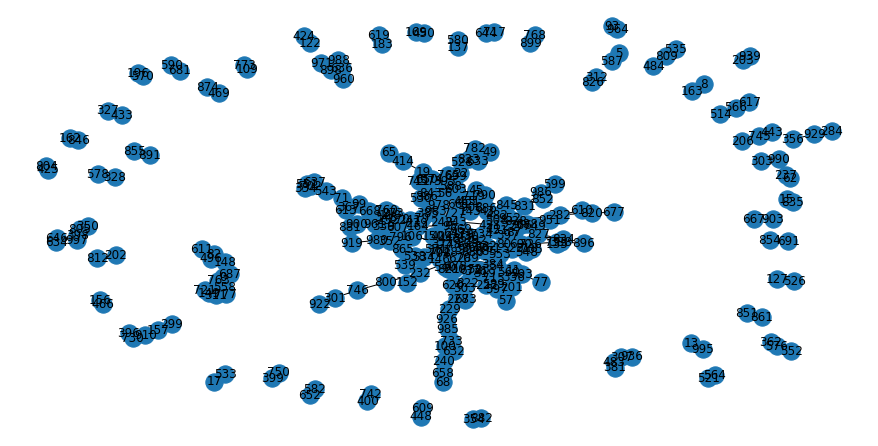

In [18]:
matplotlib.rcParams['figure.figsize'] = [12, 6]

edges = candidates
G = nx.Graph()
G.add_edges_from(edges)
nx.draw(G,with_labels = True)

In [19]:
from networkx.algorithms.community.centrality import girvan_newman
from operator import itemgetter
from time import sleep

def heaviest(G):
    u, v, w = max(G.edges(data='weight'), key=itemgetter(2))
    return (u, v)

In [20]:
from networkx import edge_betweenness_centrality as betweenness
# getting the weights
comp_b = betweenness(G,normalized=False)


# New graph
Gw = nx.Graph()

for a,b in zip(comp_b.keys(),comp_b.values()):
        Gw.add_edge(a[0], a[1], weight=b)

k = 3

print(list(Gw.nodes))
print("Clusters")
comp_gn = girvan_newman(Gw, most_valuable_edge=heaviest)
for communities in itertools.islice(comp_gn, k):
    sleep(2)
    print(tuple(sorted(c) for c in communities))

[0, 687, 763, 148, 558, 5, 587, 8, 163, 11, 384, 560, 593, 670, 904, 13, 995, 15, 835, 17, 533, 19, 414, 588, 65, 22, 431, 699, 719, 765, 978, 56, 528, 633, 823, 983, 49, 782, 38, 430, 150, 179, 243, 451, 571, 647, 669, 828, 146, 232, 289, 332, 355, 376, 523, 534, 540, 620, 700, 734, 821, 248, 319, 685, 43, 72, 227, 508, 688, 45, 603, 686, 54, 336, 880, 404, 761, 95, 239, 530, 886, 143, 164, 241, 57, 597, 62, 237, 68, 658, 240, 71, 99, 543, 668, 770, 553, 397, 827, 951, 421, 482, 77, 78, 80, 106, 161, 728, 87, 218, 292, 548, 705, 726, 352, 980, 79, 118, 252, 273, 348, 961, 385, 843, 749, 808, 82, 496, 611, 952, 366, 93, 964, 606, 339, 607, 727, 908, 672, 690, 334, 551, 637, 702, 367, 613, 760, 100, 985, 229, 733, 796, 919, 109, 773, 122, 424, 127, 526, 135, 388, 834, 137, 580, 465, 661, 831, 845, 538, 149, 311, 721, 777, 708, 478, 152, 800, 156, 466, 157, 299, 162, 846, 900, 374, 446, 169, 450, 183, 619, 196, 570, 201, 715, 202, 812, 203, 939, 206, 745, 443, 222, 589, 228, 503, 673, 82

### MinHashing, s = 0.15

In [21]:
# get candidate pairs without Locality-Sensitive Hashing

signatures = []  # signatures for all files

for fname in abstracts:
    shingles = get_shingles(fname, k=5)
    signature = minhash_vectorized(shingles, A, B, nextPrime, maxShingleID, nsig)
    signatures.append(signature)

s = 0.15  # similarity threshold
Nfiles = len(signatures)
t = time()
candidates = []
for i in range(Nfiles):
    for j in range(i+1, Nfiles):
        Jsim = np.mean(signatures[i] == signatures[j])  # average number of similar items in 
        if Jsim >= s:                                      # two vectors, equivalente to Jaccard 
            candidates.append((i,j))
t2 = time() - t
print("finding candidates took {} seconds".format(t2))
print("found {} candidates".format(len(candidates)))

finding candidates took 7.191392421722412 seconds
found 3175 candidates


In [22]:
candidates[:5]

[(0, 149), (0, 400), (0, 547), (0, 558), (0, 687)]

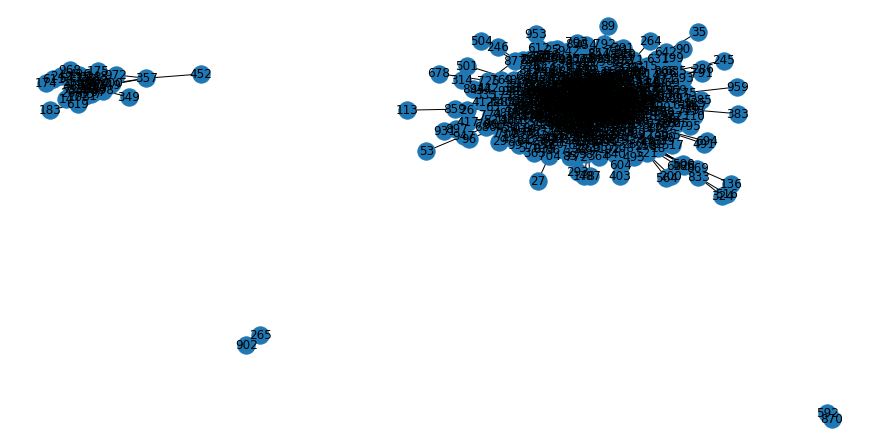

In [23]:
matplotlib.rcParams['figure.figsize'] = [12, 6]

edges = candidates
G1 = nx.Graph()
G1.add_edges_from(edges)
nx.draw(G1,with_labels = True)

In [24]:
# getting the weights
comp_b = betweenness(G1,normalized=False)

# New graph
Gw = nx.Graph()

for a,b in zip(comp_b.keys(),comp_b.values()):
        Gw.add_edge(a[0], a[1], weight=b)

k = 3

print(list(Gw.nodes))
print("Clusters")
comp_gn = girvan_newman(Gw, most_valuable_edge=heaviest)
for communities in itertools.islice(comp_gn, k):
    sleep(2)
    print(tuple(sorted(c) for c in communities))

[0, 149, 400, 547, 558, 687, 735, 763, 809, 920, 137, 148, 311, 357, 415, 777, 7, 82, 580, 742, 972, 968, 103, 323, 349, 535, 619, 707, 721, 789, 175, 249, 563, 484, 2, 145, 25, 122, 446, 505, 594, 597, 609, 666, 761, 796, 804, 808, 882, 3, 55, 128, 313, 432, 559, 644, 827, 960, 191, 426, 641, 689, 697, 713, 938, 973, 325, 376, 428, 560, 101, 272, 550, 778, 5, 40, 131, 134, 209, 239, 291, 334, 345, 348, 533, 551, 617, 846, 918, 963, 69, 80, 87, 229, 250, 328, 365, 396, 408, 421, 624, 717, 760, 983, 133, 135, 214, 312, 388, 508, 588, 632, 699, 733, 762, 775, 826, 834, 72, 140, 164, 240, 317, 410, 453, 509, 565, 607, 636, 683, 807, 866, 898, 939, 945, 971, 4, 61, 171, 241, 307, 361, 673, 936, 126, 867, 20, 22, 79, 99, 118, 120, 130, 143, 150, 156, 162, 182, 222, 236, 243, 248, 252, 263, 273, 322, 327, 329, 337, 355, 366, 395, 404, 457, 464, 470, 483, 497, 514, 574, 576, 634, 653, 667, 668, 682, 686, 688, 711, 730, 741, 749, 750, 766, 770, 820, 847, 860, 896, 904, 909, 910, 926, 961, 965,

([0, 7, 14, 82, 103, 137, 148, 149, 174, 175, 183, 249, 268, 311, 323, 349, 357, 400, 415, 452, 484, 496, 535, 547, 558, 563, 580, 611, 619, 687, 707, 721, 735, 742, 763, 777, 789, 809, 920, 968, 972], [2, 3, 4, 5, 6, 8, 9, 11, 12, 13, 15, 17, 18, 19, 20, 22, 25, 26, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 43, 45, 46, 48, 49, 53, 54, 55, 56, 57, 59, 60, 61, 62, 63, 64, 65, 66, 68, 69, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 83, 84, 85, 86, 87, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 104, 106, 108, 109, 110, 111, 113, 115, 116, 117, 118, 119, 120, 122, 123, 124, 126, 127, 128, 129, 130, 131, 133, 134, 135, 136, 138, 139, 140, 141, 142, 143, 145, 146, 150, 151, 152, 153, 154, 156, 157, 158, 161, 162, 163, 164, 165, 166, 168, 169, 171, 172, 173, 177, 178, 179, 180, 181, 182, 184, 185, 186, 187, 189, 191, 192, 193, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 208, 209, 210, 212, 213, 214, 216, 217, 218, 219, 220, 222, 225, 226, 227, 228, 229, 231, 232, 233,

### MinHashing, s = 0.1

In [25]:
# get candidate pairs without Locality-Sensitive Hashing

signatures = []  # signatures for all files

for fname in abstracts:
    shingles = get_shingles(fname, k=5)
    signature = minhash_vectorized(shingles, A, B, nextPrime, maxShingleID, nsig)
    signatures.append(signature)

s = 0.1  # similarity threshold
Nfiles = len(signatures)
t = time()
candidates = []
for i in range(Nfiles):
    for j in range(i+1, Nfiles):
        Jsim = np.mean(signatures[i] == signatures[j])  # average number of similar items in 
        if Jsim >= s:                                      # two vectors, equivalente to Jaccard 
            candidates.append((i,j))
t2 = time() - t
print("finding candidates took {} seconds".format(t2))
print("found {} candidates".format(len(candidates)))

finding candidates took 6.704033613204956 seconds
found 53841 candidates


In [26]:
candidates[:5]

[(0, 7), (0, 14), (0, 50), (0, 82), (0, 103)]

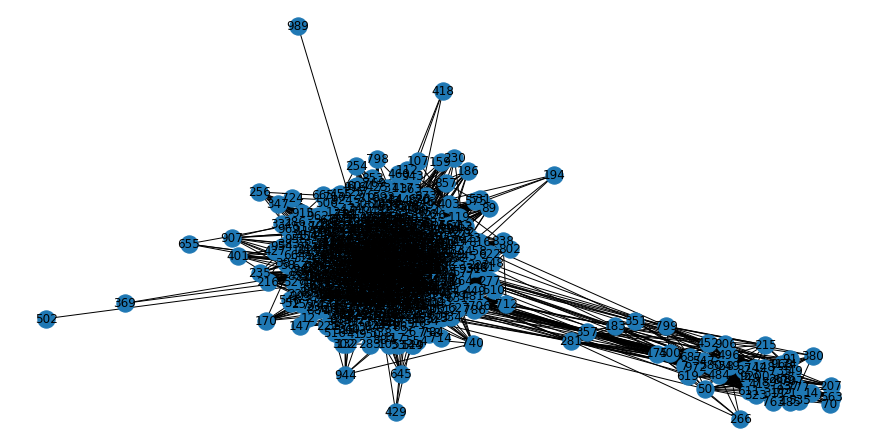

In [27]:
matplotlib.rcParams['figure.figsize'] = [12, 6]

edges = candidates
G2 = nx.Graph()
G2.add_edges_from(edges)
nx.draw(G2,with_labels = True)

In [28]:
# getting the weights
comp_b = betweenness(G2,normalized=False)

# New graph
Gw = nx.Graph()

for a,b in zip(comp_b.keys(),comp_b.values()):
        Gw.add_edge(a[0], a[1], weight=b)

k = 3

print(list(Gw.nodes))
print("Clusters")
comp_gn = girvan_newman(Gw, most_valuable_edge=heaviest)
for communities in itertools.islice(comp_gn, k):
    sleep(2)
    print(tuple(sorted(c) for c in communities))

[0, 7, 14, 50, 82, 103, 137, 148, 149, 175, 207, 249, 311, 380, 400, 415, 452, 484, 485, 496, 547, 558, 563, 580, 611, 687, 721, 735, 742, 763, 777, 789, 799, 809, 906, 920, 968, 972, 248, 268, 281, 349, 357, 540, 707, 535, 38, 174, 215, 323, 351, 91, 183, 619, 70, 80, 212, 266, 585, 891, 505, 503, 673, 722, 938, 288, 681, 435, 762, 643, 278, 72, 553, 265, 919, 261, 138, 1, 10, 37, 42, 51, 57, 78, 87, 95, 100, 110, 120, 129, 154, 202, 208, 238, 250, 289, 293, 324, 340, 358, 392, 395, 437, 438, 509, 520, 522, 568, 590, 599, 603, 613, 642, 653, 654, 683, 702, 728, 750, 787, 788, 790, 797, 805, 826, 894, 900, 962, 990, 4, 19, 22, 46, 55, 58, 88, 127, 146, 152, 182, 213, 236, 254, 322, 332, 426, 525, 539, 551, 588, 624, 631, 652, 663, 670, 682, 700, 751, 753, 830, 873, 933, 953, 969, 993, 5, 6, 9, 13, 18, 30, 34, 44, 60, 76, 79, 86, 92, 94, 99, 101, 133, 134, 143, 156, 161, 164, 165, 168, 187, 188, 195, 198, 205, 218, 224, 225, 228, 229, 232, 234, 240, 241, 243, 245, 251, 253, 269, 270, 27

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221

## 2. From the basket list of authors/editors, using A-Priori or PCY, create a weighted network, using the support threshold as weight.

In [29]:
def readdata(k, fname="all_authors.txt", report=False):
    C_k = []
    b = 0

    with open(fname, "rt", encoding='latin1') as f:
        for line in f:
            line = line.replace('\n', '')  # remove newline symbol
            if report:
                print(line)
         
            if line != "":
                # gather all items in one basket
                C_k.append(line)
            else:
                # end of basket, report all itemsets
                for itemset in itertools.combinations(C_k, k):
                    yield frozenset(itemset)
                C_k = []
                
                if report:
                    print("")

                # report progress
                # print every 1000th element to reduce clutter
                if report:
                    if b % 1000 == 0:
                        print('processing bin ', b)
                    b += 1

    # last basket
    if len(C_k) > 0:
        for itemset in itertools.combinations(C_k, k):
            yield frozenset(itemset)
    

In [30]:
import time

def get_C(k):

    start = time.time()
    C = {}
    for key in readdata(k):  # False report
        if key not in C:
            C[key] = 1
        else:
            C[key] += 1
    print("Took {}s for k={}".format((time.time() - start), k))
    return C


C1 = get_C(1)
C2 = get_C(2)

Took 0.44055891036987305s for k=1
Took 0.8150126934051514s for k=2


In [31]:
start = time.time()

N = 10  # frequency threshold

# find frequent 1-tuples (individual items)
C1 = {}
for key in readdata(k=1, report=False):
    if key not in C1:
        C1[key] = 1
    else:
        C1[key] += 1    
        
print("{} items".format(len(C1)))

# filter stage
L1 = {}
for key, count in C1.items():
    if count >= N:
        L1[key] = count
print('{} items with >{} occurances'.format(len(L1), N))

C2_items = set([a.union(b) for a in L1.keys() for b in L1.keys()]) # List comprehensions in python

# find frequent 2-tuples
C2 = {}
for key in readdata(k=2):
    # filter out non-frequent tuples
    if key not in C2_items:
        continue

    # record frequent tuples
    if key not in C2:
        C2[key] = 1
    else:
        C2[key] += 1
        
print("{} items".format(len(C2)))

# filter stage
L2 = {}
for key, count in C2.items():
    if count >= N:
        L2[key] = count
print('A-priori: {} items with >{} occurances'.format(len(L2), N))

end = time.time()
print('It took {:.2f} sec.'.format(end-start))

74315 items
4316 items with >10 occurances
37555 items
A-priori: 1713 items with >10 occurances
It took 38.77 sec.


In [32]:
aut = []
num = []
for key, value in L2.items():
    aut.append(list(key))
    num.append(value)

In [33]:
for x in aut:
    x.append(num[aut.index(x)])
arr = np.array(aut)

In [34]:
new_array = [[i, j, int(k)] for i, j, k in arr]

In [35]:
# make the graph
N = 77    # nodes
w1 = 5    # threshold's weight 

G3 = nx.Graph()
for i in range(1, N):
    G3.add_node(i)
for n1, n2, w in new_array:
    if w >= w1:
        G3.add_edge(n1, n2, weight=w)

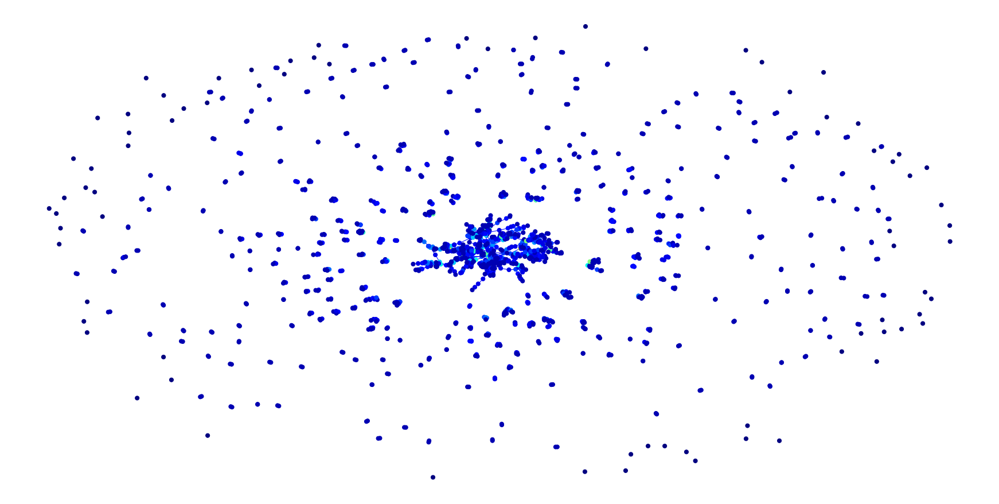

In [36]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = [24, 12]

# show graph
node_degrees_1 = nx.degree(G3)
node_degrees = list(dict(node_degrees_1).values())
nx.draw(G3, node_size=50, edge_color="b", cmap=plt.get_cmap('jet'), node_color = node_degrees)
plt.show()

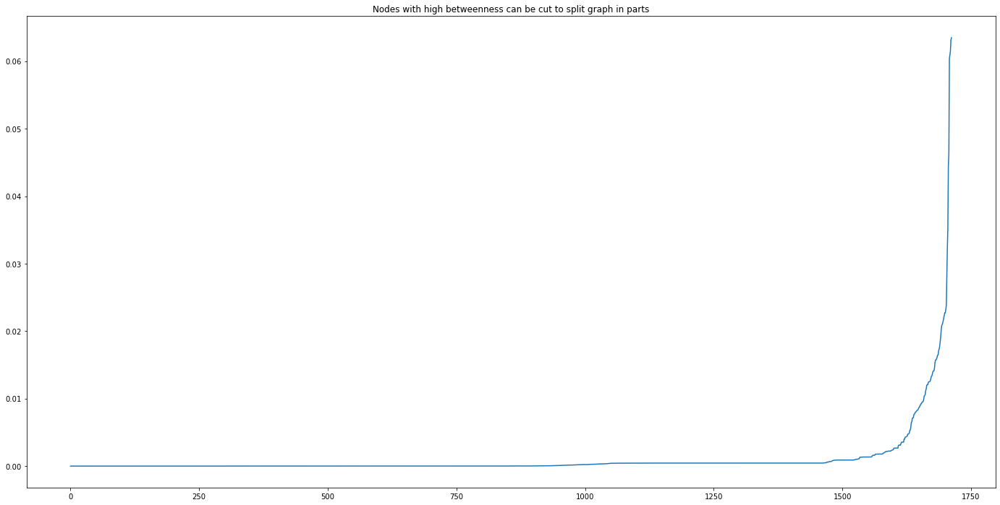

In [37]:
# print betweenness
bt = list(nx.edge_betweenness(G3).values())
plt.plot(range(len(bt)), sorted(bt))
plt.title("Nodes with high betweenness can be cut to split graph in parts")
#plt.ylim([0, 0.02])
plt.show()

In [38]:
# remove edges with betweenness larger than threshold
thr = 0.0025 # around 70% of the max value
while True:
    bt = nx.edge_betweenness(G3)
    
    i = np.argmax(list(bt.values()))
    if list(bt.values())[i] < thr:
        break
    n1, n2 = list(bt.keys())[i]
    G3.remove_edge(n1, n2)

# clean graph from single-node components for easy printing
for n, d in list(nx.degree(G3)):
    if d == 0:
        G3.remove_node(n)

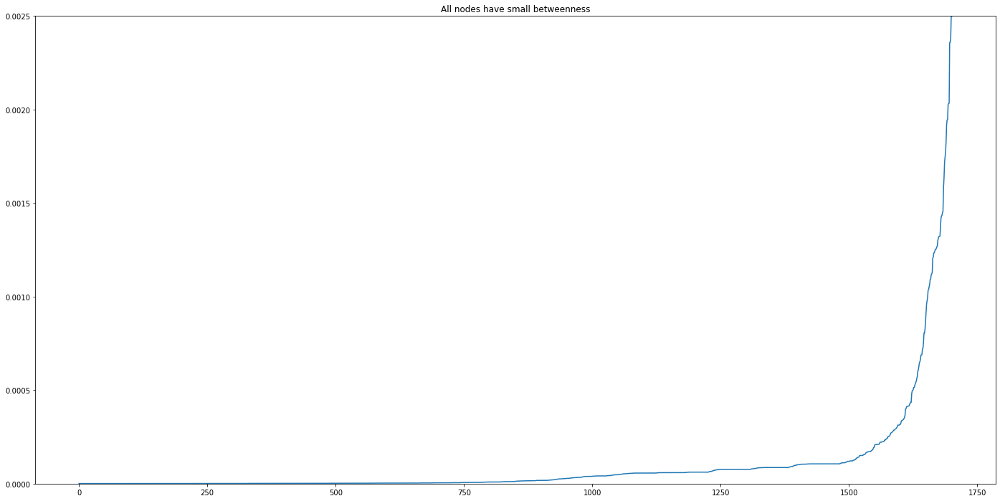

In [39]:
# print new betweenness
bt = nx.edge_betweenness(G3).values()
plt.plot(range(len(bt)), sorted(bt))
plt.title("All nodes have small betweenness")
plt.ylim([0, 0.0025])
plt.show()

## 3. Find the communities for the networks obtained in 1. and 2. Comment about the results with respect to the different thresholds and methods. How does it compare with the same analysis using 1-NN done in previous tasks?

### Minhashing, s = 0.2

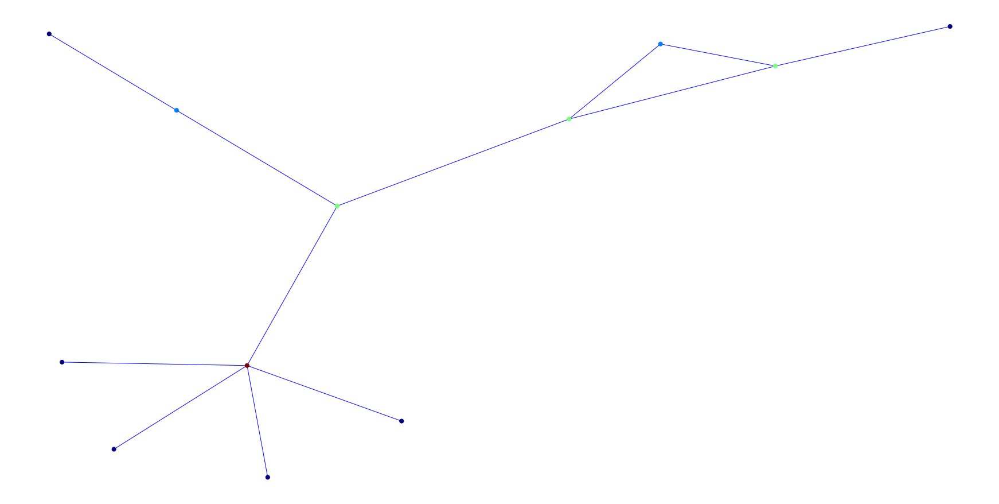

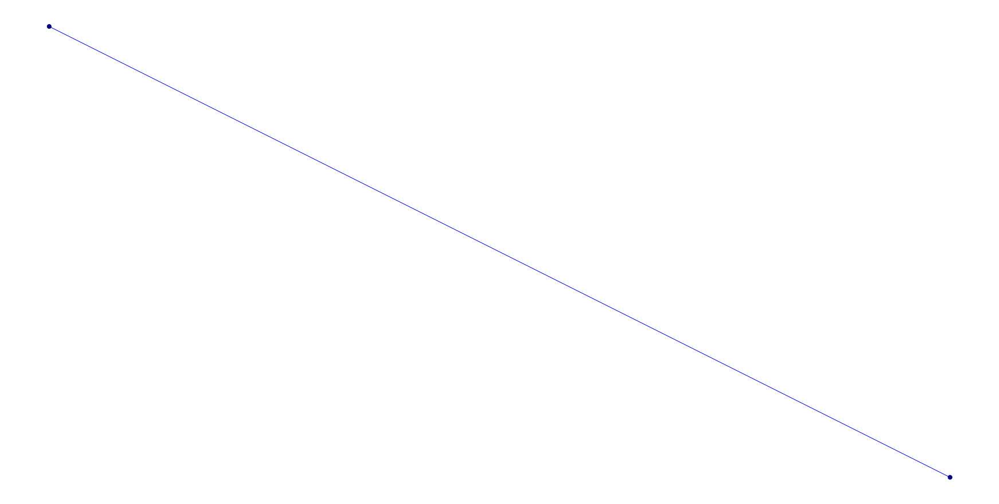

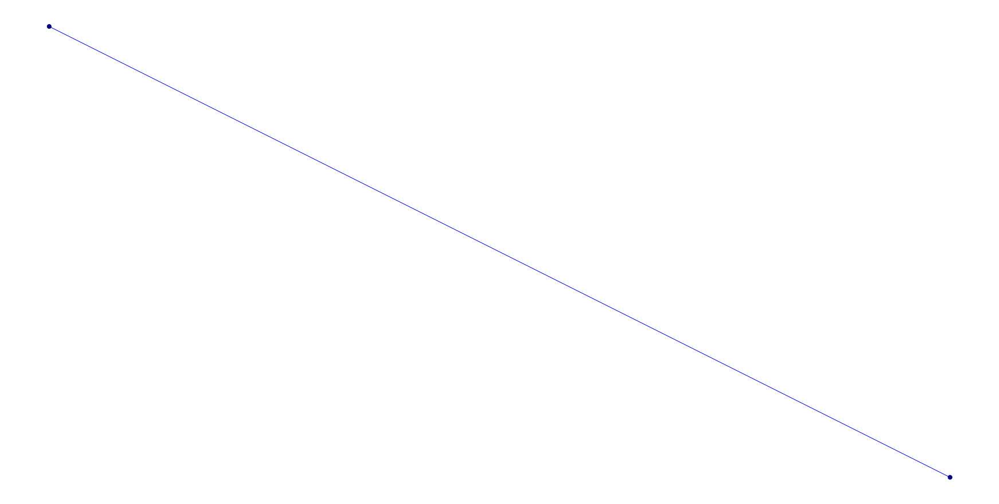

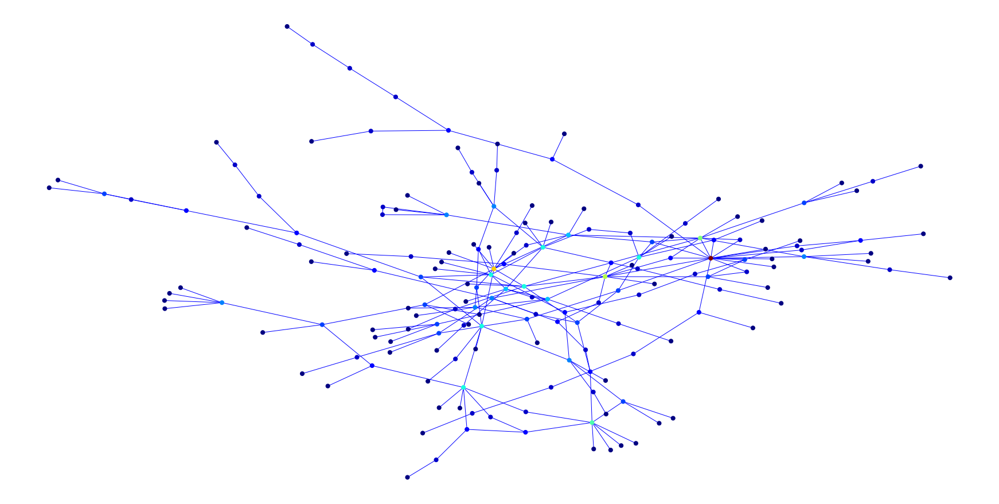

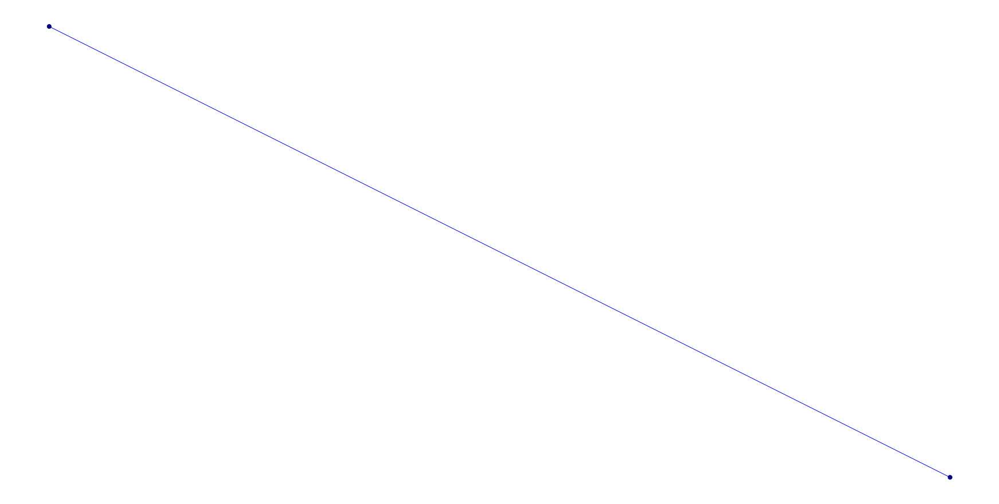

...

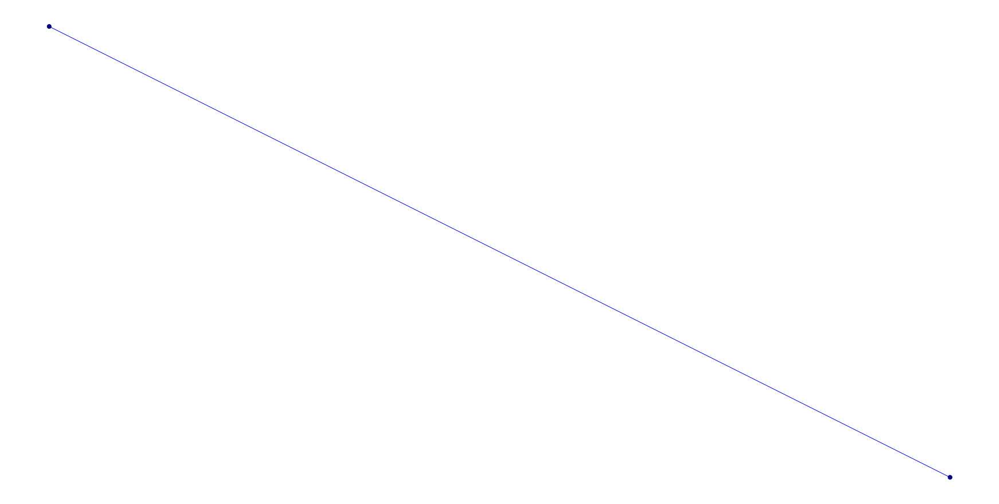

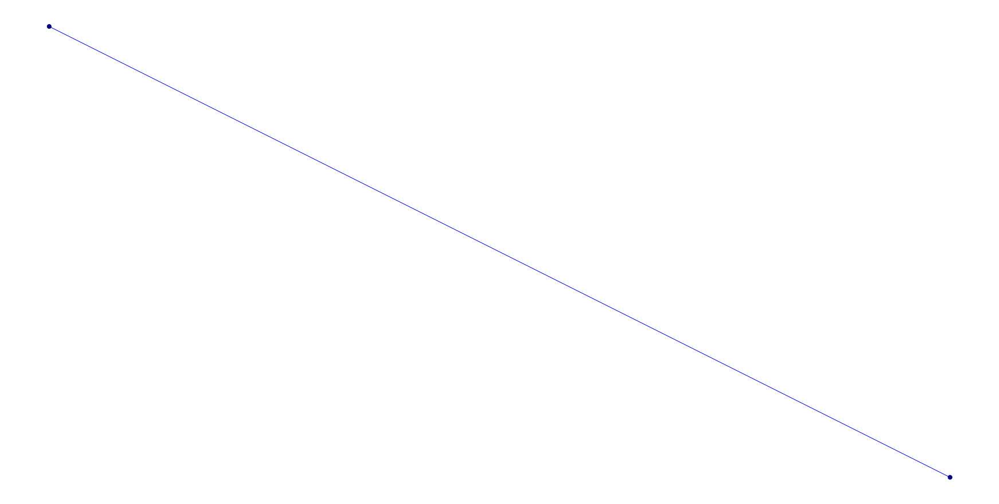

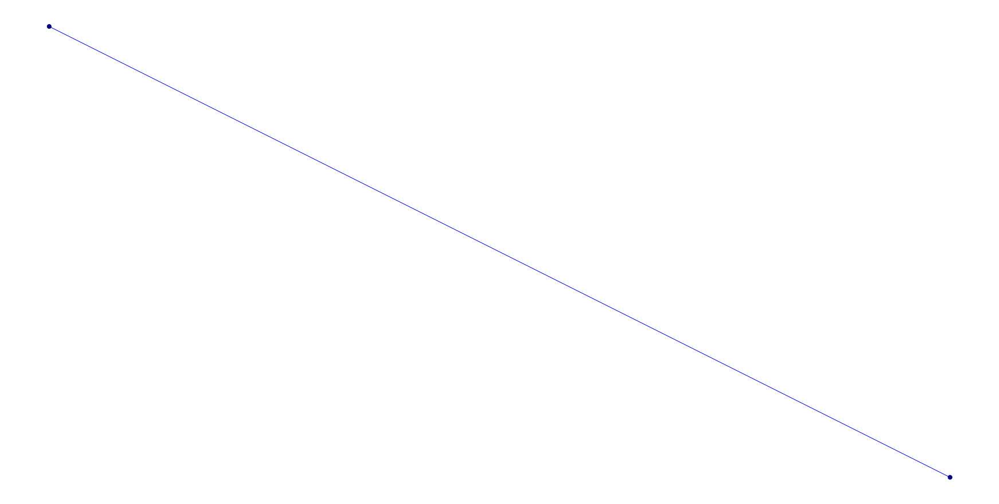

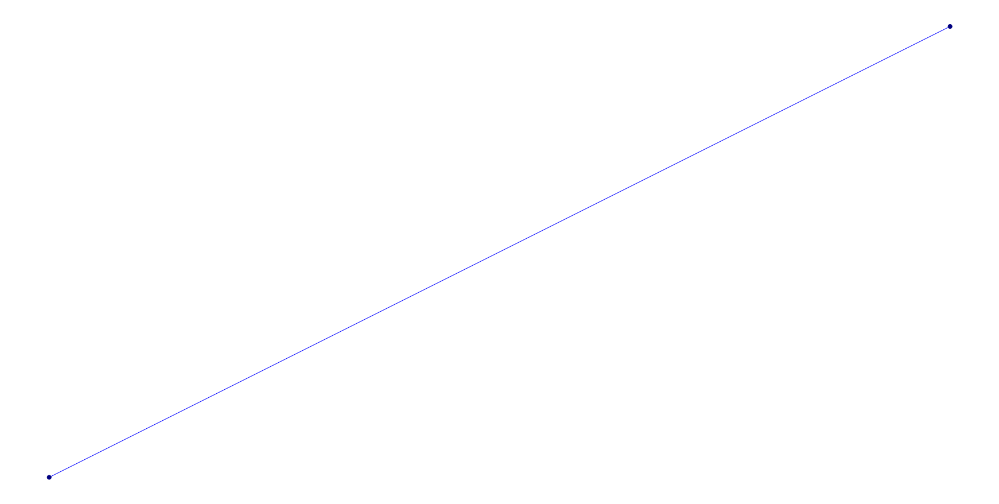

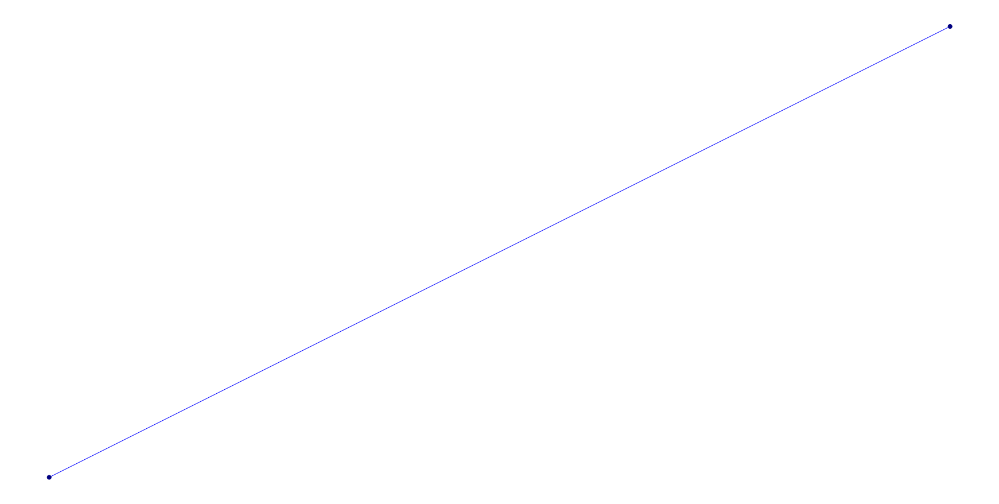

In [43]:
def connected_component_subgraphs(G):
    for c in nx.connected_components(G):
        yield G.subgraph(c)
        

for a in connected_component_subgraphs(G):
    node_degrees = list(dict(nx.degree(a)).values())
    nx.draw(a, node_size=50, edge_color="b", cmap=plt.get_cmap('jet'), node_color = node_degrees)
    plt.show()

### Minhashing, s = 0.15

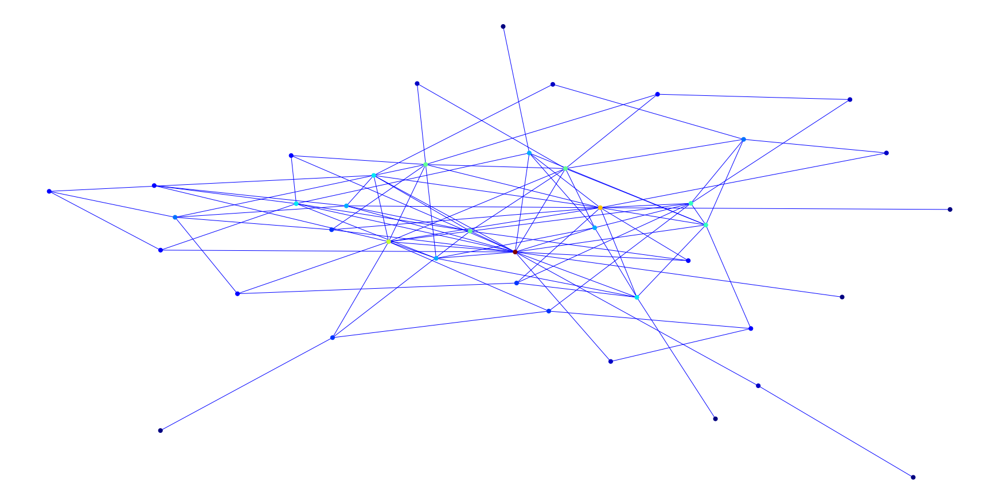

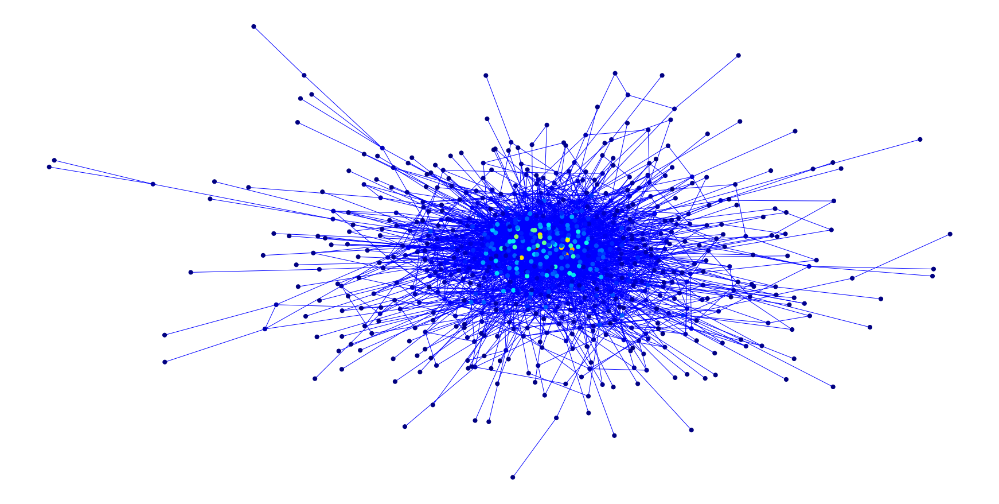

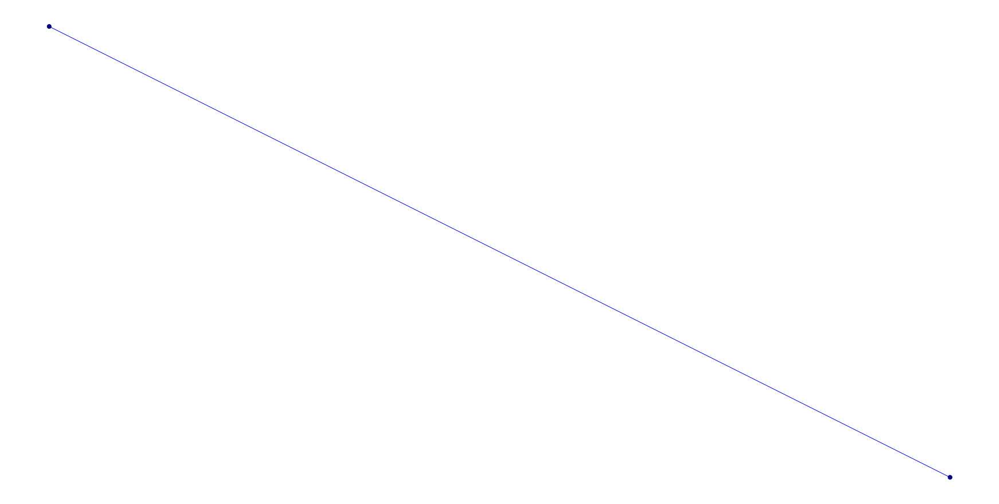

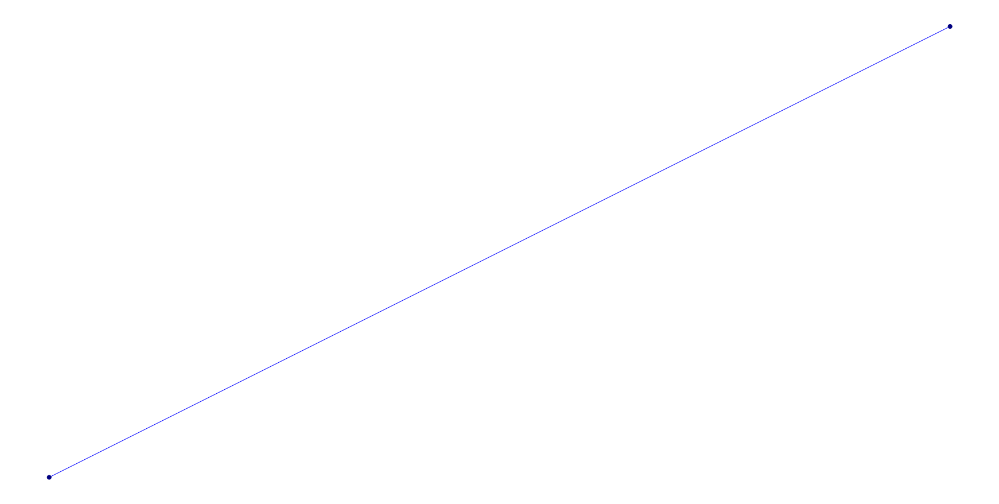

In [45]:
for a in connected_component_subgraphs(G1): 
    node_degrees = list(dict(nx.degree(a)).values())
    nx.draw(a, node_size=50, edge_color="b", cmap=plt.get_cmap('jet'), node_color = node_degrees)
    plt.show()

### Minhashing = 0.1

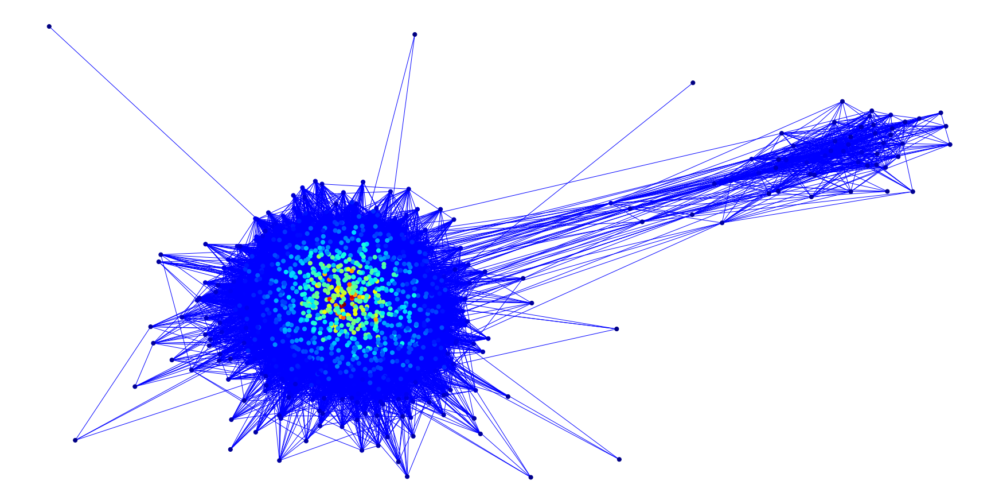

In [46]:
for a in connected_component_subgraphs(G2): 
    node_degrees = list(dict(nx.degree(a)).values())
    nx.draw(a, node_size=50, edge_color="b", cmap=plt.get_cmap('jet'), node_color = node_degrees)
    plt.show()

### PCY, N = 10

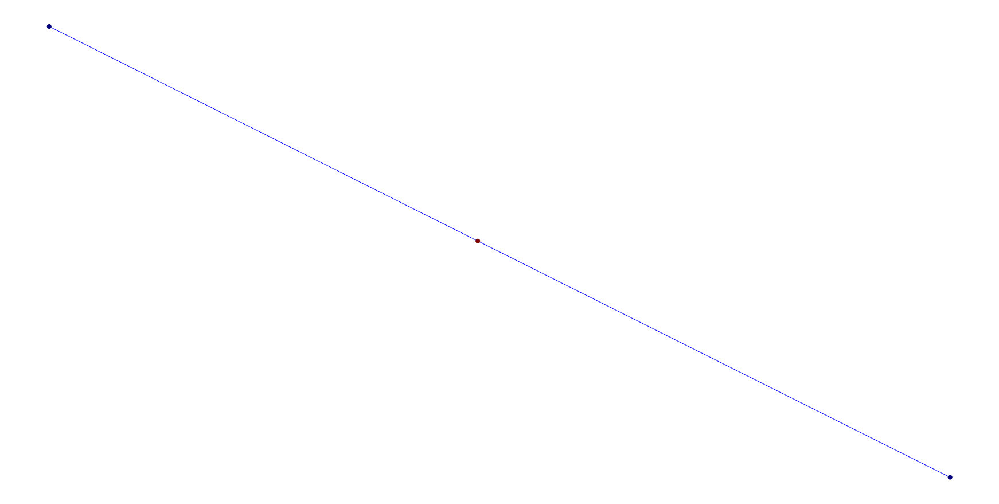

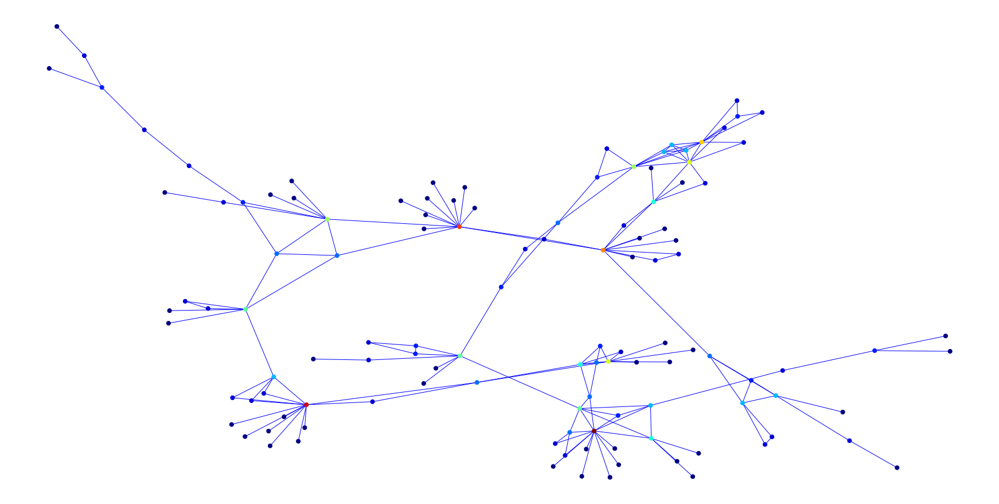

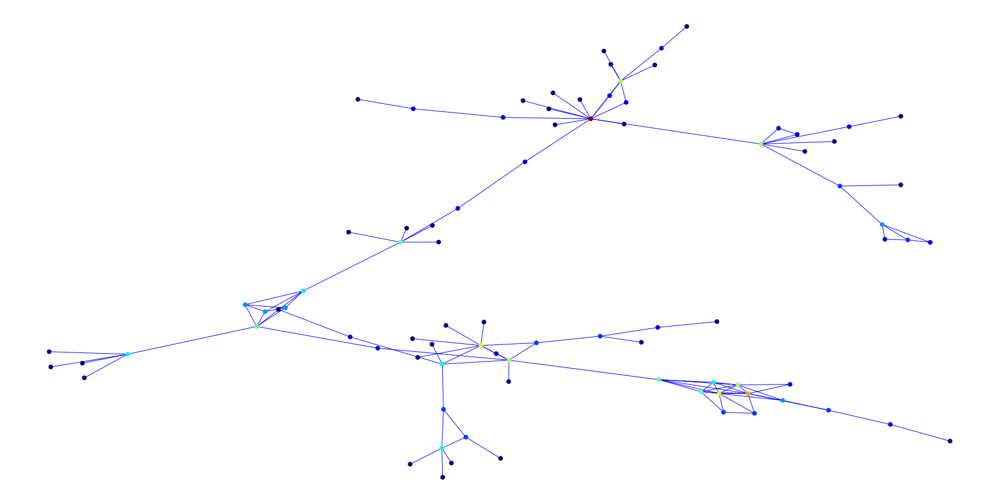

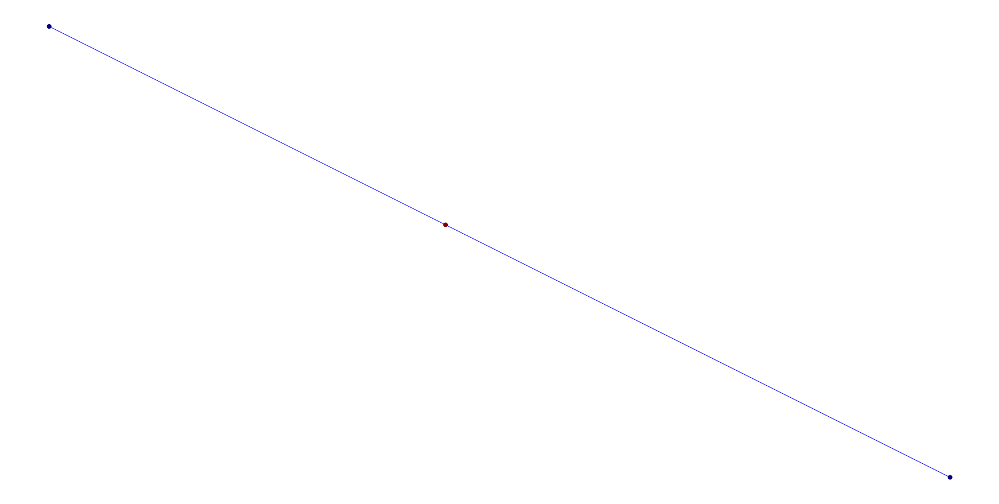

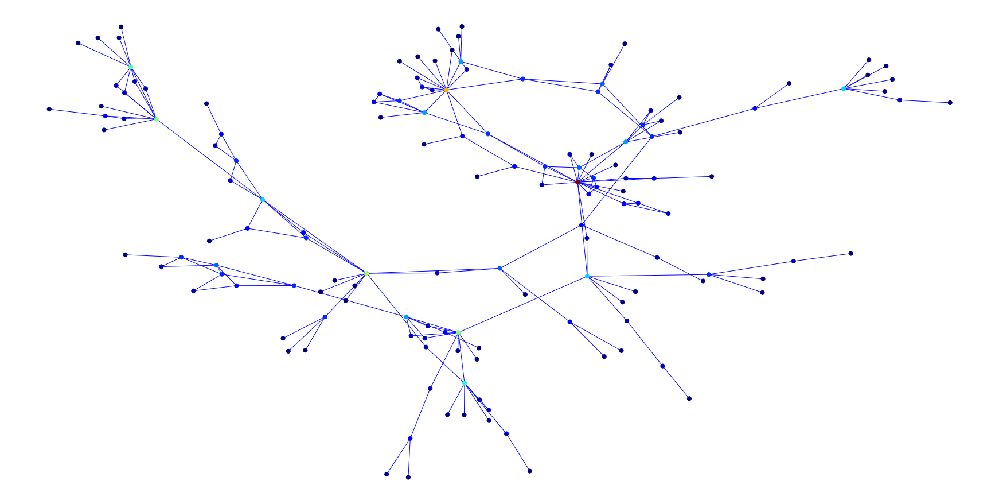

...

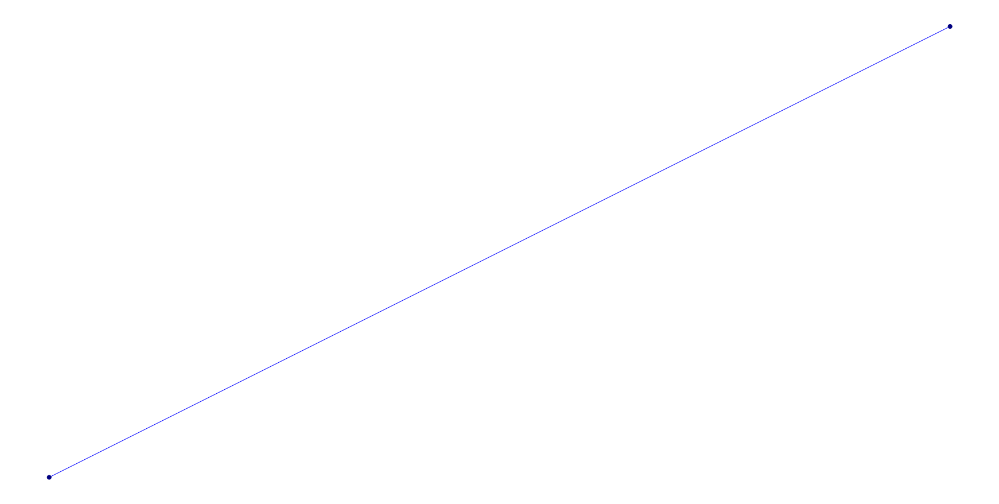

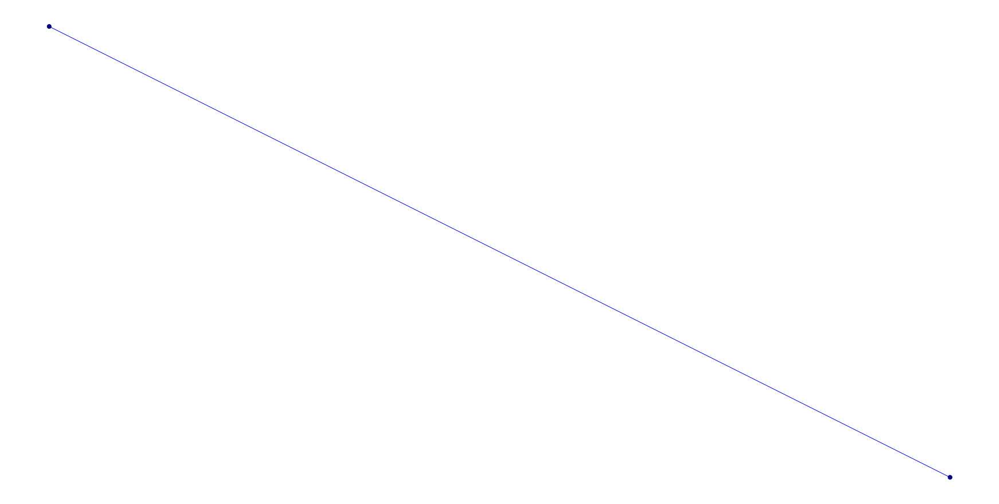

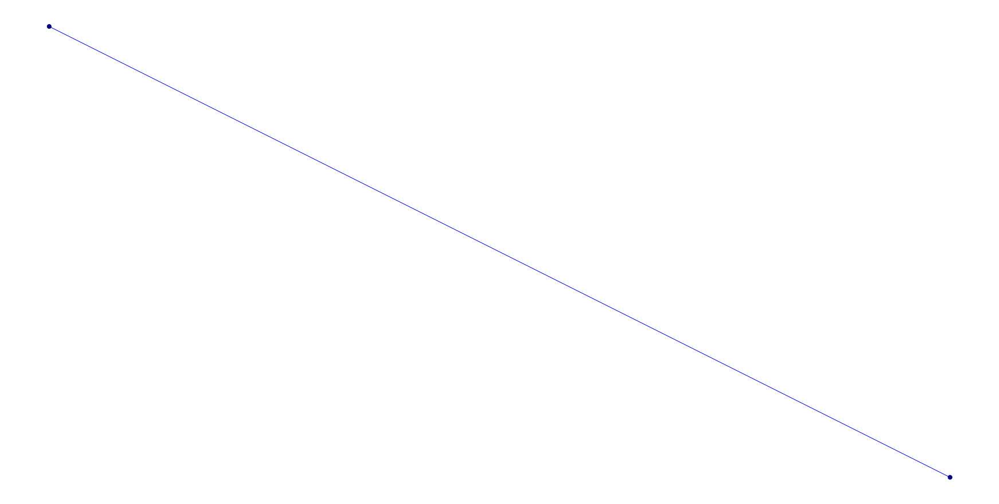

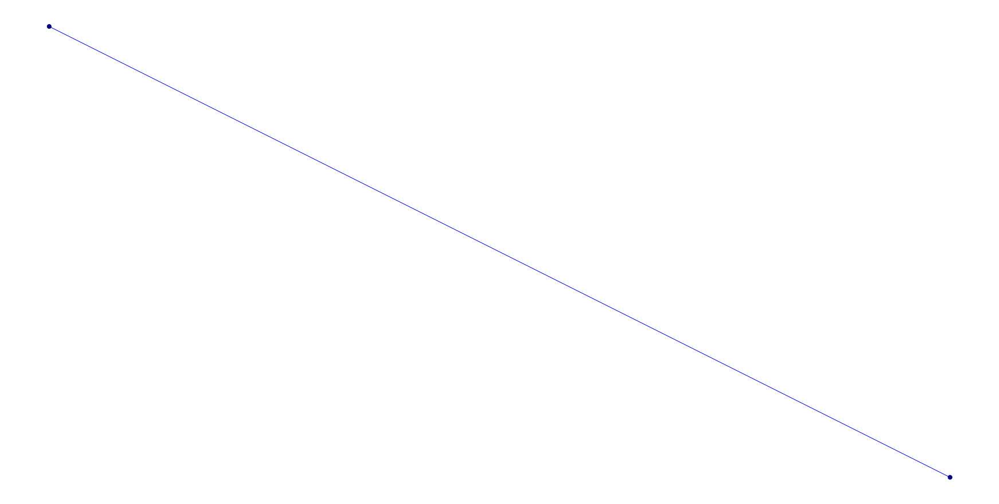

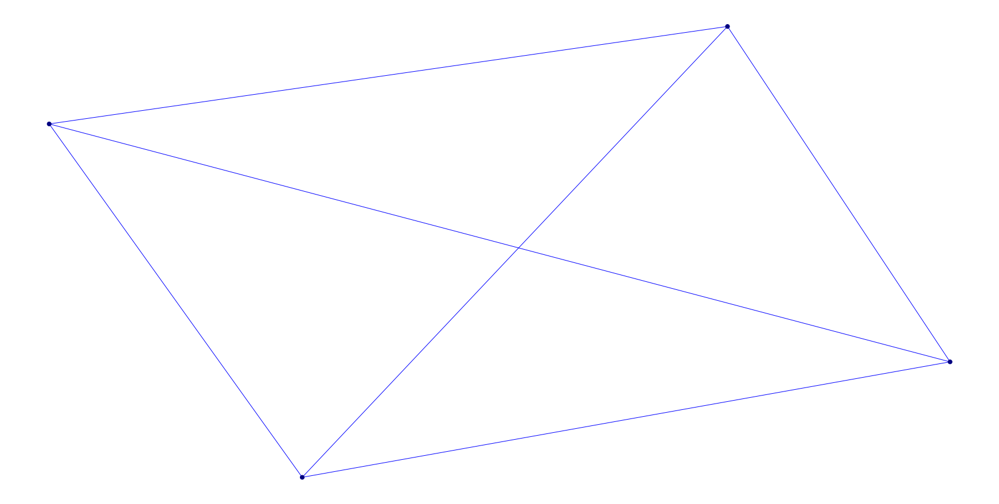

In [44]:
for a in connected_component_subgraphs(G3): 
    node_degrees = list(dict(nx.degree(a)).values())
    nx.draw(a, node_size=50, edge_color="b", cmap=plt.get_cmap('jet'), node_color = node_degrees)
    plt.show()

From the communities for the network obtained in 1, it is seen that as the threshold decreases the communities start to overlap.

The communities for the network obtained in 2. are coherent with the result found in previous task. 

In the previous task, we made clusters out of the authors. Almost half of it was 2 member clusters. And in the rest of the clusters there were more authors.

Communities for the network obtained in 2. also shows that there are many 2 member communities and the rest of it has bigger communities.

## 4. Use a ready-made software, library or service (eg. gephi) for visualizing one the network in 1. or 2.Comment your results. 

In [41]:
nx.write_gexf(G, "image.gexf")

The unweighted network from the obtained similar pairs with similarity threshold 0.2 was used.

In the graph nodes represent abstracts and edges represent that there is at least 20% of similarity between them.

There are 406 nodes and 584 edges.

The average degree is 2.877 which shows the average number of edges connected to a node, in our case it shows the average number of authors that collaborate.

There are overlapping communities. 